In [1]:
import numpy as np

import matplotlib as mpl
mpl.rc('image', cmap='gray')
from matplotlib import pyplot as plt

from pyramids import Pyramid as pyr
from pyrwidget import LayerTab as lt
from pyrwidget import MultiLayer as ml

from skimage.draw import circle, line_nd, line

from ipywidgets import interact

# Rendre visible l'invisible : la radiographie numérique

### Mots clés

Contraste, intégrale, Beer-Lambert, loi de Poisson, radiographie, rehaussement

## Loi de Beer-Lambert

Tout matériau est caractérisé par un *coefficient linéaire d'atténuation* $\mu$ qui a comme dimension l'inverse d'une longueur. A la traversée d'un milieu, l'intensité initiale d'un faisceau de rayons X ($I_0$) est atténuée selon la loi de Beer-Lambert suivante :
$$
I = I_0 \exp(-p),
$$
où :
$$
p = \left(-\int_L \mu(l)dl\right),
$$
et $L$ est la ligne suivie par les photons X. Nous raffinerons cette formule au fur et à mesure du cours, car cette modélisation est incomplète. A commencer par l'absence de bruit statistique ! En réalité, l'observation $I$ fluctue autour de la valeur donnée par la loi de Beer-Lambert selon une loi de Poisson :
$$
I \sim \mathcal{P}\left(I_0 \exp\left(-\int_L \mu(l)dl\right)\right).
$$

En pratique, si on mesure $I$, on s'intéresse plutôt à l'intégrale $p$, obtenue par passage au logarithme:
$$
p=\log(I_0)-\log(I).
$$

### Questions

1. Ecrire une fonction `sumCols(img)` qui prend une image 2D en entrée et retourne le profil somme le long de l'axe vertical (l'axe des $x$ de l'image). A quoi correspond cette fonction dans la loi de Beer-Lambert ?
2. Ecrire une fonction `noisy(img,I0)` qui calcule la projection selon la loi de Beer-Lambert (avec sa statistique de Poisson), et renvoie la partie linéaire $p$.
3. Une loi de Poisson a pour densité de probabilité $P(X=k)=\frac{\lambda^k}{k!}e^{-\lambda}$. Calculer l'espérance et la variance d'une variable aléatoire suivant une loi de Poisson. Qu'en déduisez-vous ? (Faites le calcul !)
4. Jouer avec le widget en variant le rayon de l'insert de contraste, la valeur de ce contraste, ainsi que `I0`. Qu'observez-vous ? Est-il facile d'identifier cet insert dans l'image ? et sur le profil ? Pourquoi ?

#### Encore un peu de maths !...
5. Cet exemple simple utilise une projection (dite "parallèle") de disques centrés, uniformes ; si $\mu$ est le coefficient linéaire d'atténuation d'un disque centré de rayon $R$, pouvez-vous calculer sa projection analytiquement ?
6. En déduire la projection analytique de l'objet du widget : un disque uniforme de rayon $R_0$ et de coefficient d'atténuation $\mu$, dans lequel on a un disque uniforme de rayon $R_1$ et de coefficient d'atténuation $\mu+\Delta\mu$. Quelle est la valeur maximale de cette projection ? On la notera $C$.
7. On dira que le "fond" est donné par la valeur de la projection aux bords du disque de contraste ; autrement dit, le fond est la valeur de la projection que vous avez calculée, prise en $R_1$ ; quelle est cette valeur ? On la notera $B$.
8. Calculer le contraste relatif $(C-B)/B$ ; pouvez-vous le simplifier si $R_1$ est "petit" devant $R_0$ ? Comparez alors ce ratio au contraste relatif des coefficients linéaires d'atténuation des deux disques.

In [ ]:
def sumCols(img):
    #### Votre code ici

    


def noisy(profil,I0):
    #### Votre code ici
    #### Vous pouvez appeler une réalisation d'une loi de Poisson
    #### de paramètre lambda avec la fonction:
    #### np.random.poisson(lambda)









In [ ]:
# Création d'une image de test
img0 = np.zeros((256,256))
rr, cc = circle(127.5,127.5,100,img0.shape)
mu_bkg = 0.03
img0[rr,cc] = mu_bkg


def visuProfil(rayon,contraste,I0):
    img = img0.copy()
    rr, cc = circle(127.5,127.5,rayon,img.shape)
    img[rr,cc] += contraste
    profil = sumCols(img)

    f,ax = plt.subplots(1,2,figsize=(15,5))
    ax[0].imshow(img)
    ax[1].plot(profil,lw=4,alpha=0.4)
    ax[1].plot(noisy(profil,I0),c='r',alpha=0.4)
    ax[1].grid()
    ax[1].legend(['Signal parfait', 'Signal bruité'])
    
interact(lambda rayon,contrasteX10,k: visuProfil(rayon,contrasteX10*0.1,10**k),rayon=(0,90,10),contrasteX10=(0.01,0.4,0.01),k=(2,6,1))

interactive(children=(IntSlider(value=40, description='rayon', max=90, step=10), FloatSlider(value=0.2, descri…

<function __main__.<lambda>>

## Radiographie planaire

### Questions

1. Visualisez une radiographie planaire "brute" ci-dessous (placer le curseur `vmin` tout à gauche et le curseur `vmax` tout à droite ; soyez patients : le chargement peut prendre un peu de temps) ; que représente la courbe rouge ? Que pouvez-vous dire de l'image chargée ?
2. Quelles observations faites-vous sur les zones de feu nu ? Avez-vous un moyen simple d'estimer l'intensité $I_0$ nécessaire à la normalisation (on supposera que $I_0$ est constante sur l'image) ?

(Dans certains cas, estimer la valeur de $I_0$ très précisément est important, et l'économie de la dose n'est pas nécessaire ; il arrive alors que l'on prenne une image sans objet dans le champ, pour avoir directement accès à l'image $I_0$ à utiliser par la suite.)

3. Récupérer la composante linéaire $p=\log(I_0)-\log(I)$. Quelles observations faites-vous sur cette image ?

In [ ]:
# chargement de l'image
I = np.fromfile(path+'/data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))

# visualisation
def window(I,vmin=None,vmax=None):
    f,ax = plt.subplots(1,2,figsize=(20,10))
    ax[0].imshow(I,vmin=vmin,vmax=vmax)
    d = ax[1].hist(I.flatten(),bins=256)
    ax1 = ax[1].twinx()
    x = 0.5*(d[1][1:]+d[1][:-1])
    y = x/x.max()*(2**14-1)
    y = np.zeros(x.size)
    y[x>vmax] = 2**14-1
    y[(vmin<=x) & (x<=vmax)] = (x[(vmin<=x) & (x<=vmax)]-vmin)/(vmax-vmin)*(2**14-1)
    ax1.plot(x,y,lw=4,c='r')
    ax1.set_xlim([I.min(),I.max()])
    plt.show()
    

# observations sur une version sous-échantillonnée de l'image pour plus de rapidité
J = I[::16,::16]
interact(lambda vmin,vmax: window(J,vmin,vmax), vmin=(0,2**14,512), vmax=(0,2**14,512))

interactive(children=(IntSlider(value=8192, description='vmin', max=16384, step=512), IntSlider(value=8192, de…

<function __main__.<lambda>>

In [ ]:
# Question 2: estimation de l'intensité I0
# On supposera que I0 est une constante

#### Votre code ici









In [ ]:
# Question 3: récupération de la partie linéaire
# p = log(I0)-log(I)

#### Votre code ici








In [ ]:
interact(lambda vmin,vmax: window(p,vmin,vmax), vmin=(p.min(),p.max(),0.25), vmax=(p.min(),p.max(),0.25))

interactive(children=(FloatSlider(value=3.0, description='vmin', max=6.435308456420898, step=0.25), FloatSlide…

<function __main__.<lambda>>

## Rehaussement d'image

Si l'image transformée en log a une meilleure dynamique (car les niveaux de gris évoluent linéairement avec les épaisseurs, et non plus de façon exponentielle), elle est encore assez grisâtre ; aucune information ne ressort particulièrement : et si on voulait focaliser sur les os ? Et si on voulait focaliser sur des variations de tissus mous ?... C'est ce que l'étape de rehaussement d'image s'applique à faire.

### Questions

1. On se propose de transformer les niveaux de gris des pixels $x$ selon la transformation suivante (appelée courbe de gain dans la suite du cours) : $$F(x)=A\left((1-B)f(x)+B\bar{x}\right),$$ où $\bar{x}$ est la moyenne de $x$, $$f(x)=x_{\max}\cdot\mathrm{sign}(x)|x/x_{\max}|^\gamma$$ et $x_{\max} = \max(|x|)$. Coder cette courbe de gain et jouer avec les paramètres. Quelle interprétation faites-vous de cette transformation ? Quelle propriété de la courbe de gain joue particulièrement sur l'amélioration (ou la réduction) de contraste ?
2. Appliquez cette courbe sur l'image précédente (`N=0`) ; quelles observations faites-vous sur l'image transformée ? Arrivez-vous à rehausser un élément en particulier ? Pourquoi ?
3. Renseignez-vous sur les pyramides laplaciennes, et relancez le code ci-dessous pour décomposer notre image radiographique (`N>0`). Qu'observez-vous ? En quoi cette décomposition pourrait-elle aider dans le rehaussement d'image ?
4. <font color='red'> [O] Comment rehausser une image radiographique pour : (a) visualiser de petites structures du poumon ? (b) rehausser les os ? Connaissez-vous d'autres décompositions multiéchelles avec lesquelles vous pourriez jouer ? Connaissez-vous d'autres algorithmes de rehaussement d'image ?</font>

In [ ]:
# Courbe de gain
def gain(x,gamma=1,A=1,B=0):
    #### Votre code ici
    return A*((1 - B) * np.abs(x).max() * np.sign(x) * np.abs(x * np.abs(x).max()) ** gamma + B * x.mea)

def gain_plt(gamma=1,A=1,B=0):
    x = np.linspace(0,1,512)
    plt.plot(x,x)
    plt.plot(x,gain(x,gamma,A,B))
    plt.axis('square')
    plt.grid()
    plt.legend(['Identité', 'Gain'])

interact(gain_plt,gamma=(0,3,0.1),A=(0.1,2,0.1),B=(0,1,0.2))

interactive(children=(FloatSlider(value=1.0, description='gamma', max=3.0), FloatSlider(value=1.0, description…

<function __main__.gain_plt>

In [ ]:
# Pyramide laplacienne
N = 0
msp = ml(p,gain,N)

Initialize reconstruction...

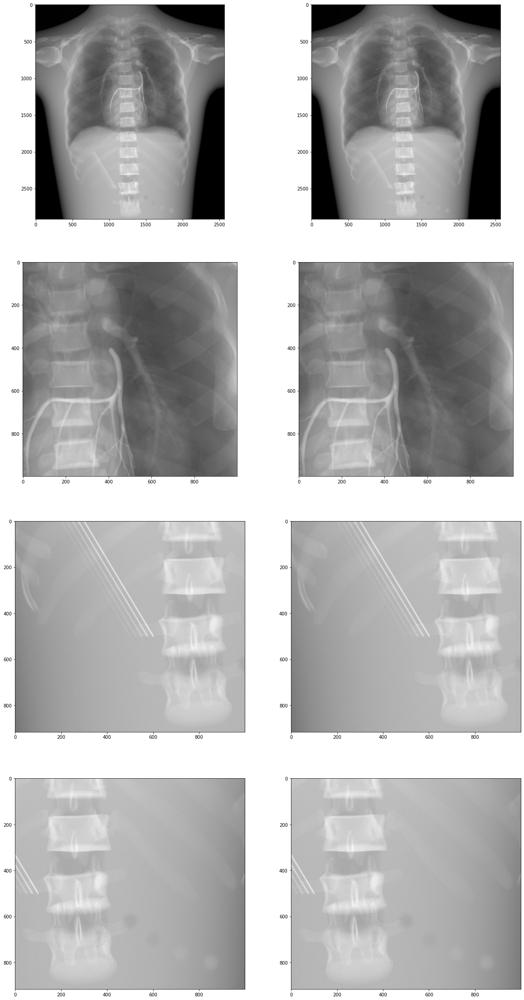

In [ ]:
# Reconstruction
out = msp.im_out
f,ax = plt.subplots(4,2,figsize=(20,40))
ax[0,0].imshow(p)
ax[0,1].imshow(out)
ax[1,0].imshow(p[500:1500,1000:2000],vmin=p.min(),vmax=p.max())
ax[1,1].imshow(out[500:1500,1000:2000],vmin=out.min(),vmax=out.max())
ax[2,0].imshow(p[2000:,500:1500],vmin=p.min(),vmax=p.max())
ax[2,1].imshow(out[2000:,500:1500],vmin=out.min(),vmax=out.max())
ax[3,0].imshow(p[2000:,1000:2000],vmin=p.min(),vmax=p.max())
ax[3,1].imshow(out[2000:,1000:2000],vmin=out.min(),vmax=out.max())

### Conclusions

1. Il est plus facile d'identifier un contraste dans une image que dans une intégrale
2. L'identification du contraste dans l'image ne dépend pas de l'étendue de l'image (information locale)
3. L'identification du contraste dans l'intégrale dépend de l'étudentue du profil (information globale)
4. Le bruit de Poisson augmente avec $I_0$ mais le rapport signal à bruit (SNR) augmente également
5. Plus le bruit de Poisson augmente, plus il est difficile d'identifier la présence d'un saut de contraste dans l'intégrale
6. Une image en intensité est difficile à lire : on préfère repasser en dynamique linéaire par passage au log
7. Le rehaussement est une étape essentielle avant présentation de l'image au radiologue ; son réglage dépend de la tâche clinique et du "look-and-feel"
8. Dans une courbe de gain, le contraste est réglé par la pente (la dérivée) de la courbe

### Ouverture : les systèmes EOS/EOSedge et les limites de la radiographie numérique

Présentation en cours (diapositives disponibles après le cours).

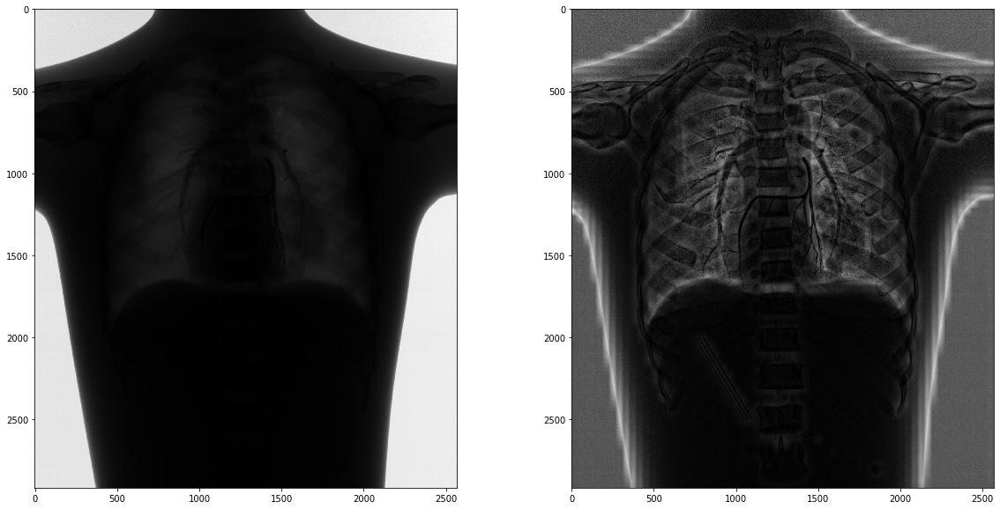

In [28]:
import cv2 as cv
I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
I = I.astype(np.uint16)
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(64,64))
cl1 = clahe.apply(I)
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(I)
ax[1].imshow(cl1)

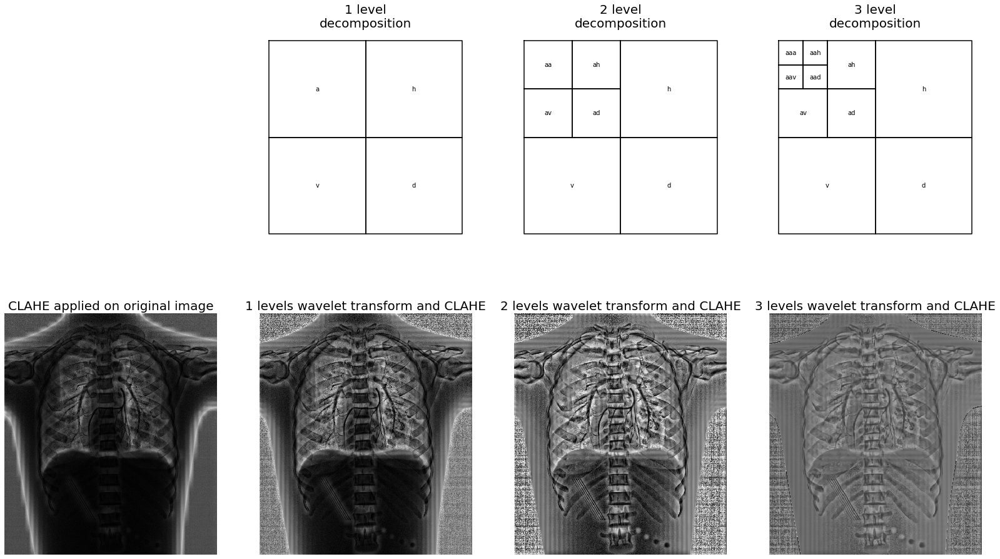

In [139]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))

fig, ax = plt.subplots(2, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        ax[0, i].axis('off')
        ax[1, i].set_title('CLAHE applied on original image', fontsize=20)
        ax[1, i].imshow(cl1, cmap=plt.cm.gray)
        ax[1, i].axis('off')
        continue

    draw_2d_wp_basis((512, 512), wavedec2_keys(i), ax=ax[0, i], label_levels=3)
    ax[0, i].set_title('{} level\ndecomposition'.format(i), fontsize=20)
    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))

    ax[1, i].set_title('{} levels wavelet transform and CLAHE'.format(str(i)), fontsize=15)
    ax[1, i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[1, i].axis('off')

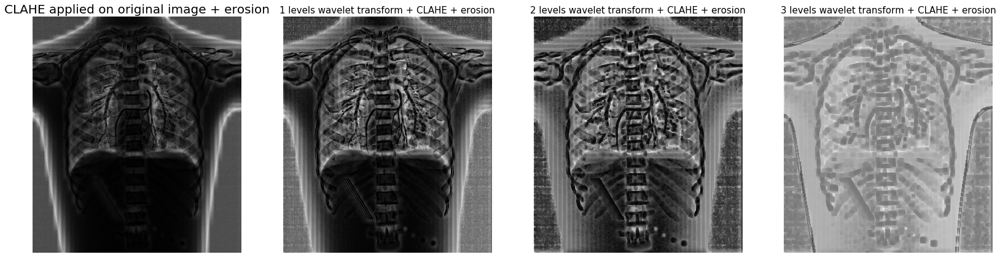

In [141]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))
kernel = np.ones((5,5),np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        cl1 = cv.erode(cl1,kernel,iterations = 1)
        ax[i].axis('off')
        ax[i].set_title('CLAHE applied on original image + erosion', fontsize=15)
        ax[i].imshow(cl1, cmap=plt.cm.gray)
        ax[i].axis('off')
        continue

    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))
    c[0] = cv.erode(c[0],kernel,iterations = 1)

    ax[i].set_title('{} levels wavelet transform + CLAHE + erosion'.format(str(i)), fontsize=15)
    ax[i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[i].axis('off')

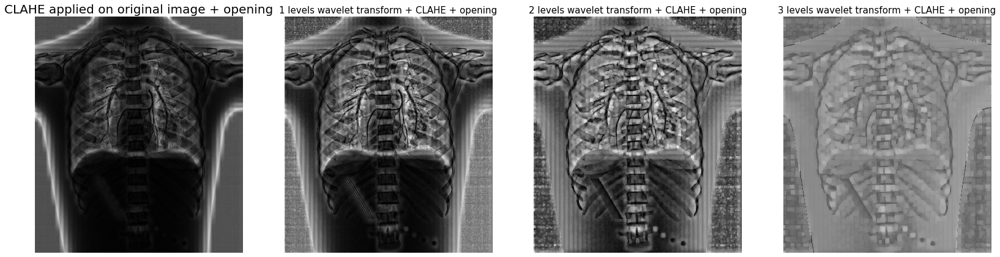

In [142]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))
kernel = np.ones((5,5),np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        cl1 = cv.morphologyEx(cl1, cv.MORPH_OPEN, kernel)
        ax[i].axis('off')
        ax[i].set_title('CLAHE applied on original image + opening', fontsize=15)
        ax[i].imshow(cl1, cmap=plt.cm.gray)
        ax[i].axis('off')
        continue

    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))
    c[0] = cv.morphologyEx(c[0], cv.MORPH_OPEN, kernel)

    ax[i].set_title('{} levels wavelet transform + CLAHE + opening'.format(str(i)), fontsize=15)
    ax[i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[i].axis('off')

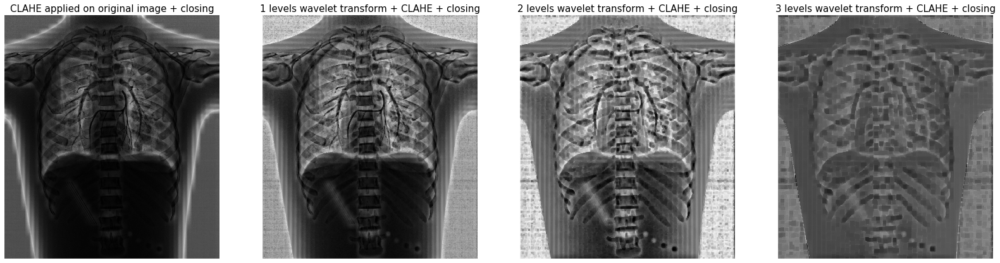

In [143]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))
kernel = np.ones((5,5),np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        cl1 = cv.morphologyEx(cl1, cv.MORPH_CLOSE, kernel)
        ax[i].axis('off')
        ax[i].set_title('CLAHE applied on original image + closing', fontsize=15)
        ax[i].imshow(cl1, cmap=plt.cm.gray)
        ax[i].axis('off')
        continue

    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))
    c[0] = cv.morphologyEx(c[0], cv.MORPH_CLOSE, kernel)

    ax[i].set_title('{} levels wavelet transform + CLAHE + closing'.format(str(i)), fontsize=15)
    ax[i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[i].axis('off')

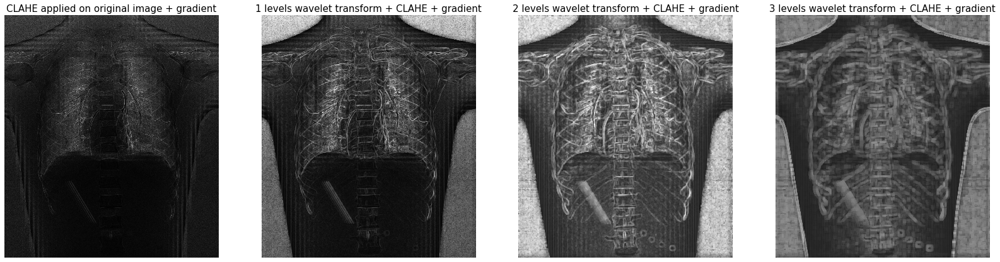

In [144]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))
kernel = np.ones((5,5),np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        cl1 = cv.morphologyEx(cl1, cv.MORPH_GRADIENT, kernel)
        ax[i].axis('off')
        ax[i].set_title('CLAHE applied on original image + gradient', fontsize=15)
        ax[i].imshow(cl1, cmap=plt.cm.gray)
        ax[i].axis('off')
        continue

    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))
    c[0] = cv.morphologyEx(c[0], cv.MORPH_GRADIENT, kernel)

    ax[i].set_title('{} levels wavelet transform + CLAHE + gradient'.format(str(i)), fontsize=15)
    ax[i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[i].axis('off')

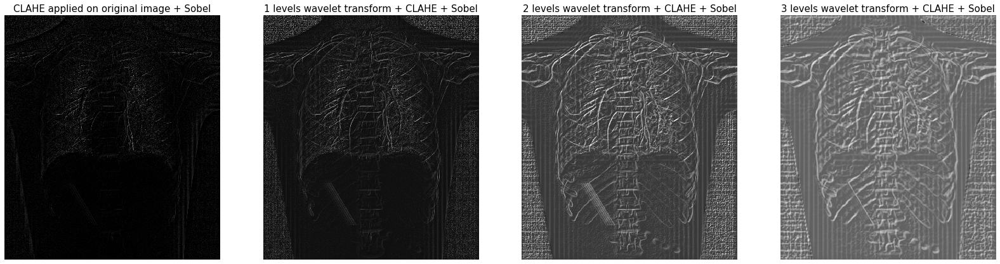

In [145]:
import numpy as np
import pywt
from matplotlib import pyplot as plt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
import cv2 as cv

I = np.fromfile('data/I.2569.2916.raw',dtype='float32').reshape((2916,2569))
clahe = cv.createCLAHE(clipLimit=40.0, tileGridSize=(48,48))
kernel = np.ones((5,5),np.uint8)

fig, ax = plt.subplots(1, 4, figsize=(28, 16))

for i in range(4):
    if i == 0:
        cl1 = clahe.apply(I.astype(np.uint16))
        g = cv.GaussianBlur(cl1, (3, 3), 0)
        x = cv.Sobel(g, -1, 1, 0)
        y = cv.Sobel(g, -1, 0, 1)
        cl1 = cv.addWeighted(x, 0.5, y, 0.5, 0)
        ax[i].axis('off')
        ax[i].set_title('CLAHE applied on original image + Sobel', fontsize=15)
        ax[i].imshow(cl1, cmap=plt.cm.gray)
        ax[i].axis('off')
        continue

    c = pywt.wavedec2(I, 'db1', level=i)
    c[0] = clahe.apply(c[0].astype(np.uint16))
    g = cv.GaussianBlur(c[0], (3, 3), 0)
    x = cv.Sobel(g, -1, 1, 0)
    y = cv.Sobel(g, -1, 0, 1)
    c[0] = cv.addWeighted(x, 0.5, y, 0.5, 0)

    ax[i].set_title('{} levels wavelet transform + CLAHE + Sobel'.format(str(i)), fontsize=15)
    ax[i].imshow(pywt.waverec2(c, 'db1'), cmap=plt.cm.gray)
    ax[i].axis('off')